In [1]:
import os
import sys
sys.path.append('/mnt/mnt/5TB_slot2/Tobias')
sys.path.append('/mnt/mnt/5TB_slot2/Tobias/TobiasPy/fastMRI')
sys.path.append('/mnt/mnt/4TB_pcie/fastBrain/')
import h5py
import numpy as np
import numpy.fft as nf
import pytorch_ssim
import matplotlib.pyplot as plt
import torch
from torch.utils.data import DataLoader
from models.unet.unet_model import UnetModel as UnetModel
from FF_net import FF_net
from FF_net import FF_simple_net
from FF_net import FF_net_tanh
from FF_net import Complex_net
import argparse
from common.args import Args
import models.unet.run_unet  as Run
import torch.nn as nn
import logging
import pathlib
import random
from torch.utils.data import Dataset
import time
from torch.nn import functional as F
import shutil
from tensorboardX import SummaryWriter
import torchvision
from torchvision import transforms, utils
import net_utils as nu
import calendar
import datetime
from longOne import ComplexFourier,ComplexEndToEnd
from complex_unet_model import ComplexUnetModel
from complex_end_to_end import ComplexEndToEnd

import sigpy as sp
import sigpy.plot as pl
from skimage.metrics import structural_similarity as np_ssim
import vd_spiral

from FF_net import Complex_net_ext

%load_ext autoreload
%reload_ext autoreload
%autoreload 2

In [2]:
sys.argv=['']
def create_arg_parser():
    timestamp = calendar.timegm(time.gmtime())
    human_readable = datetime.datetime.fromtimestamp(timestamp).isoformat()
    #human_readable="pure_inverse_fourier"
    human_readable="ComplexEndToEnd_Kspace_Spiral_multiChannel"
    parser = argparse.ArgumentParser(description="ML parameters")
    parser.add_argument('--num-pools', type=int, default=4, help='Number of U-Net pooling layers')
    parser.add_argument('--drop-prob', type=float, default=0.0, help='Dropout probability')
    parser.add_argument('--num-chans', type=int, default=32, help='Number of U-Net channels')

    parser.add_argument('--batch-size', default=16, type=int, help='Mini batch size')
    parser.add_argument('--num-epochs', type=int, default=250, help='Number of training epochs')
    parser.add_argument('--lr', type=float, default=0.0001, help='Learning rate')
    parser.add_argument('--lr-step-size', type=int, default=100,
                        help='Period of learning rate decay')
    parser.add_argument('--lr-gamma', type=float, default=0.1,
                        help='Multiplicative factor of learning rate decay')
    parser.add_argument('--weight-decay', type=float, default=0.01,
                        help='Strength of weight decay regularization')
    parser.add_argument('--momentum', type=float, default=0.1,
                        help='Strength of optimizer momentum')

    parser.add_argument('--report-interval', type=int, default=10000, help='Period of loss reporting')
    parser.add_argument('--data-parallel', default=True,
                        help='If set, use multiple GPUs using data parallelism')
    parser.add_argument('--device', type=str, default='cuda',
                        help='Which device to train on. Set to "cuda" to use the GPU')
    parser.add_argument('--exp-dir', type=pathlib.Path, default='/mnt/mnt/5TB_slot2/Tobias/Thesis/FF_lrelu_'+str(human_readable),
                        help='Path where model and results should be saved')
    parser.add_argument('--resume', action='store_true', default=False,
                        help='If set, resume the training from a previous model checkpoint. '
                             '"--checkpoint" should be set with this')
    parser.add_argument('--checkpoint', type=str, default='/mnt/mnt/5TB_slot2/Tobias/Thesis/FF_lrelu_'+str(human_readable)+'/best_model.pt',
                        help='Path to an existing checkpoint. Used along with "--resume"')
    parser.add_argument('--logdir', type=str, default='/mnt/mnt/5TB_slot2/Tobias/Thesis/log/ff_lrelu_'+str(human_readable),
                        help='Path to an existing checkpoint. Used along with "--resume"')
    parser.add_argument('--seed', default=42, type=int, help='Seed for random number generators')
    parser.add_argument('--resolution', default=128, type=int, help='Resolution of images')
    parser.add_argument('--device_ids', default=[0,1] , help='GPUS used')
    return parser
args=create_arg_parser().parse_args()
print("save to",args.checkpoint)

save to /mnt/mnt/5TB_slot2/Tobias/Thesis/FF_lrelu_ComplexEndToEnd_Kspace_Spiral_multiChannel/best_model.pt


In [3]:
def test_fourier():
    sig = np.random.randn(args.resolution) + 1j*np.random.randn(320)
    F = np.fft.ifft(sig, axis=-1)
    # First half of inputs/outputs is real part, second half is imaginary part
    X = torch.from_numpy(np.hstack([sig.real, sig.imag])).double()
    Y = torch.from_numpy((F.real**2+F.imag**2)**(1/2)).double()
    return X,Y

class SliceData(Dataset):
    """
    A PyTorch Dataset that provides access to MR image slices.
    """
    
    def __init__(self, root="/mnt/mnt/5TB_slot2/fastMRI/multicoil_train", sample_rate=1.):
        self.examples = []
        #potential to apply pre-process transform
        files = list(pathlib.Path(root).iterdir())
        if sample_rate < 1:
            #random.shuffle(files)
            num_files = round(len(files) * sample_rate)
            files = files[:num_files]
        for fname in sorted(files):
            print(fname)
            try:
                #print(h5py.File(fname, 'r').keys())
                #maybe also only randomly select parts of slices. Otherwise lot of outer noise-like structures.
                xml = h5py.File(fname, 'r')['ismrmrd_header']
                kspace = h5py.File(fname, 'r')['kspace']
                num_slices = kspace.shape[0]
                num_channels=kspace.shape[1]
                if (kspace.shape[-2]<args.resolution) or (kspace.shape[-1]<args.resolution) or num_channels!=16:
                    continue
                print(len(self.examples))
                for slice in range(num_slices):
                    crop_size = (min(args.resolution, kspace.shape[-2]),min(args.resolution, kspace.shape[-1]))
                    k=nu.center_crop(kspace[slice], crop_size)
                    target=abs(nu.rsos(nu.make_ift(k),0))
                    m=np.max(target)
                    if m>0:
                        target/=m
                    else:
                        continue
                    #k=np.expand_dims(k, axis=1)
                    us=nu.spiral_undersampling(k,r=8)
                    us=nu.center_crop(us, crop_size)
                    us=nu.to_tensor(us)
                    us/=m
                    if np.isnan(np.sum(target)):
                        continue
                    X=us#.flatten()
                    #print(X.shape)
                    Y=nu.to_tensor(target)
                    #print(Y.shape)
                    #X,Y=test_fourier()
                    self.examples += [(fname, slice, X, Y)]
            except:
                print("Couldn't open file")
    
    def __len__(self):
        return len(self.examples)
    
    def __getitem__(self, i):
        fname, slice, f, t = self.examples[i]
#         with h5py.File(fname, 'r') as data:
#             full=to_tensor(data['kspace'][slice])
#             crop_size = (min(args.resolution, full.shape[-3]),min(args.resolution, full.shape[-2]))          
#             full=complex_center_crop(full,crop_size)
            
#             kspace = to_tensor(data['kspace'][slice])
#             crop_size = (min(args.resolution, kspace.shape[-3]), min(args.resolution, kspace.shape[-2]))
#             kspace=apply_mask(kspace)[0]
#             kspace = complex_center_crop(kspace, crop_size)
            
        return (f, t)

In [4]:
def create_data_loaders():
    #batch_size=32
    #mask_func = None
    #if args.mask_kspace:
    #    mask_func = MaskFunc(args.center_fractions, args.accelerations)
    train_data = SliceData(root="/mnt/mnt/4TB_pcie/fastBrain/multicoil_train",sample_rate=0.25)
    dev_data = SliceData(root="/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain",sample_rate=0.25)
    test_data = SliceData(root="/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain",sample_rate=0.05)
    train_loader = DataLoader(
        dataset=train_data,
        batch_size=args.batch_size,
        shuffle=True,
        num_workers=0,
        pin_memory=True,
    )
    dev_loader = DataLoader(
        dataset=dev_data,
        batch_size=args.batch_size,
        shuffle=True,
        num_workers=0,
        pin_memory=True,
    )
    test_loader=None
#     test_loader = DataLoader(
#         dataset=test_data,
#         num_workers=0,
#         pin_memory=True,
#     )
    return train_loader, dev_loader, test_loader

In [5]:
t=time.time()
train_loader, dev_loader, test_loader= create_data_loaders()
print("Time taken to load data: ",time.time()-t)

/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXFLAIR_200_6002442.h5
0
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXFLAIR_200_6002466.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXFLAIR_200_6002469.h5
16
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXFLAIR_200_6002496.h5
32
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXFLAIR_200_6002506.h5
48
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXFLAIR_200_6002549.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXFLAIR_200_6002553.h5
64
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXFLAIR_200_6002558.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXFLAIR_200_6002570.h5
80
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXFLAIR_200_6002576.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXFLAIR_200_6002595.h5
96
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXFLAIR_200_6002611.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/

/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXT2_200_6002231.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXT2_200_6002238.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXT2_209_2090155.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXT2_209_2090175.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXT2_209_2090185.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXT2_209_2090189.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXT2_209_2090196.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXT2_209_2090198.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXT2_209_2090200.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXT2_209_2090202.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXT2_209_2090219.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXT2_209_2090222.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_train/file_brain_AXT2_209_2090225.h5
/mnt/mnt/4TB_pcie/fastBra

/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_200_2000151.h5
280
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_200_2000234.h5
296
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_200_2000271.h5
312
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_200_2000304.h5
328
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_200_6002009.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_200_6002025.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_200_6002161.h5
344
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_200_6002171.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_200_6002174.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_200_6002250.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_200_6002431.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_200_6002495.h5
360
/mnt/mnt/4TB_pci

/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_202_2020373.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_202_2020588.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_207_2070240.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_207_2070513.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_207_2070567.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_208_2080489.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_209_2090150.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_209_2090255.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_209_6001065.h5
/mnt/mnt/4TB_pcie/fastBrain/multicoil_test_brain/file_brain_AXT2_209_6001200.h5
Time taken to load data:  1274.1696503162384


with torch.no_grad():
        for (f, t) in train_loader:
            print(f.shape,t.shape)
            plt.imshow(abs(nu.make_ift(nu.to_complex(f)))[0,0,:,:])
            plt.show()
            plt.imshow(t[0,:,:])
            plt.show()

In [15]:
def build_model(args,chans=args.num_chans,num_pool_layers=args.num_pools,drop_prob=0.05):
    #check every time which gpus are available!
    #device_ids=[2,3,1]
    device_ids=args.device_ids
    model=ComplexEndToEnd(in_chans=16,out_chans=1,chans=args.num_chans,num_pool_layers=args.num_pools,drop_prob=args.drop_prob,resolution=args.resolution).to(args.device)
    model=model.double()
    set_weights(model)
    if args.data_parallel and args.device=="cuda":
        model = nn.DataParallel(model,device_ids=device_ids)
    print("Model build successfully")
    #vis_weights(model)
    return model

def set_weights(model):
    model.f_layer1.conv_r.weight=torch.nn.Parameter(torch.tensor(np.load("module.c_layer1.conv_r.weight.npy")).to(args.device))
    model.f_layer1.conv_i.weight=torch.nn.Parameter(torch.tensor(np.load("module.c_layer1.conv_i.weight.npy")).to(args.device))
    model.f_layer2.conv_r.weight=torch.nn.Parameter(torch.tensor(np.load("module.c_layer2.conv_r.weight.npy")).to(args.device))
    model.f_layer2.conv_i.weight=torch.nn.Parameter(torch.tensor(np.load("module.c_layer2.conv_i.weight.npy")).to(args.device))

def vis_weights(model):
    for name, param in model.named_parameters():
        if param.requires_grad:
            print(name, param.data)
            # Heat map of neuron weights
            plt.imshow(param.data.cpu(), vmin=np.min(param.data.cpu().numpy()), vmax=np.max(param.data.cpu().numpy()), cmap='coolwarm')
            plt.show()
#            fig,ax=plt.subplots(320,1,figsize=(16,16))
#             for i in range(320):
#                 ax[i].plot(param.data.cpu()[i,:320])
#             plt.show()

def build_optim(args,params):
    optimizer = torch.optim.Adadelta(params)
    return optimizer

def load_model(checkpoint_file,args):
    checkpoint = torch.load(checkpoint_file)
    args = checkpoint['args']
    model = build_model(args)
    model.load_state_dict(checkpoint['model'])

    optimizer = build_optim(args, model.parameters())
    optimizer.load_state_dict(checkpoint['optimizer'])
    print("Model load successfully")
    return checkpoint, model, optimizer

def save_model(args, exp_dir, epoch, model, optimizer, best_dev_loss, is_new_best):
    torch.save(
        {
            'epoch': epoch,
            'args': args,
            'model': model.state_dict(),
            'optimizer': optimizer.state_dict(),
            'best_dev_loss': best_dev_loss,
            'exp_dir': exp_dir
        },
        f=exp_dir / 'model.pt'
    )
    if is_new_best:
        shutil.copyfile(exp_dir / 'model.pt', exp_dir / 'best_model.pt')
        
def eval_loss(output,target):
    l1=F.l1_loss(output, target).item()
    #print(l1)
    mse=F.mse_loss(output, target).item()
    #print(mse)
    psnr=20*np.log10(np.max(target)/np.sqrt(mse))
    try:
        ssim=np_ssim(output.to("cpu").detach().numpy(), target.squeeze(1).to('cpu').detach().numpy())
    except:
        ssim=np_ssim(output[0].to("cpu").detach().numpy(), target[0].squeeze(1).to('cpu').detach().numpy())
    #print(ssim)
    return l1,mse,ssim

def visualize(args, epoch, model, data_loader, writer):
    def save_image(image, tag):
        image -= image.min()
        image /= image.max()
        grid = torchvision.utils.make_grid(image, nrow=4, pad_value=1)
        writer.add_image(tag, grid, epoch)
    model.eval()
    
    with torch.no_grad():
        for iter, data in enumerate(data_loader):
            input, target = data
            input = input.unsqueeze(1).to(f'{args.device}:{args.device_ids[0]}')
            target = target.unsqueeze(1).to(f'{args.device}:{args.device_ids[0]}')
            output = model(input)
            save_image(target[0,:,:], 'Target')
            save_image(output[0,:,:], 'Reconstruction')
            save_image(torch.abs(target - output)[0,:,:], 'Error')
            break
            
def zero_middle(img):
    img[...,args.resolution//2,args.resolution//2]=0
    return img

In [16]:
def train_epoch(args, epoch, model, data_loader, optimizer, writer):
    model.train()
    print(model.device_ids)
    avg_loss = 0.
    start_epoch = start_iter = time.perf_counter()
    global_step = epoch * len(data_loader)
    for iter, data in enumerate(data_loader):
        f, t = data
        input = f.to(f'{args.device}:{model.device_ids[0]}')
        target = t.to(f'{args.device}:{model.device_ids[0]}')
        output_r,output_i = model(input)
        output = (output_r.squeeze(1)**2+output_i.squeeze(1)**2)**(1/2)
        
        loss = F.mse_loss(output, target)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        avg_loss = 0.99 * avg_loss + 0.01 * loss.item() if iter > 0 else loss.item()
        writer.add_scalar('TrainLoss', loss.item(), global_step + iter)

#         if iter % args.report_interval == 0:
#             print(f'Epoch = [{epoch:3d}/{args.num_epochs:3d}] ',
#                 f'Iter = [{iter:4d}/{len(data_loader):4d}] ',
#                 f'Loss = {loss.item():.4g} Avg Loss = {avg_loss:.4g} ',
#                 f'Time = {time.perf_counter() - start_iter:.4f}s')
#             logging.info(
#                 f'Epoch = [{epoch:3d}/{args.num_epochs:3d}] '
#                 f'Iter = [{iter:4d}/{len(data_loader):4d}] '
#                 f'Loss = {loss.item():.4g} Avg Loss = {avg_loss:.4g} '
#                 f'Time = {time.perf_counter() - start_iter:.4f}s',
#             )
        start_iter = time.perf_counter()
    return avg_loss, time.perf_counter() - start_epoch

def evaluate(args, epoch, model, data_loader, writer):
    model.eval()
    losses = []
    all_losses = []
    start = time.perf_counter()
    with torch.no_grad():
        for iter, data in enumerate(data_loader):
            f, t = data
            input = f.to(f'{args.device}:{model.device_ids[0]}')
            target = t.to(f'{args.device}:{model.device_ids[0]}')
            output_r,output_i = model(input)
            output = (output_r.squeeze(1)**2+output_i.squeeze(1)**2)**(1/2)

            #mean = mean.unsqueeze(1).unsqueeze(2).to(args.device)
            #std = std.unsqueeze(1).unsqueeze(2).to(args.device)
            #target = target * std + mean
            #output = output * std + mean

            #norm = norm.unsqueeze(1).unsqueeze(2).to(args.device)
            #loss = F.mse_loss(output / norm, target / norm, size_average=False)
            loss = F.mse_loss(output, target)
            losses.append(loss.item())
            all_losses.append(eval_loss(output,target))
        writer.add_scalar('Dev_Loss', np.mean(losses), epoch)
        print('Dev_Loss', np.mean(losses),'Epoch', epoch)
        all_losses=np.array(all_losses)
        print('L1_Loss', np.mean(all_losses[:,0]),"L2_Loss",np.mean(all_losses[:,1]),"SSIM_Loss",np.mean(all_losses[:,2]),'Epoch', epoch)
    return np.mean(losses), time.perf_counter() - start

Model build successfully
[0, 1]
Dev_Loss 0.03182989376072208 Epoch 0
L1_Loss 0.08027570383661535 L2_Loss 0.03182989376072208 SSIM_Loss 0.48500807829950093 Epoch 0
Epoch = [   0/ 250] TrainLoss = 0.01979  DevLoss = 0.03183 TrainTime = 136.4964s DevTime = 48.7844s


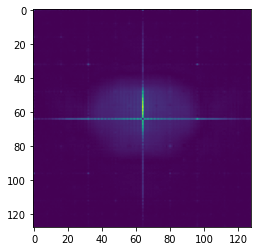

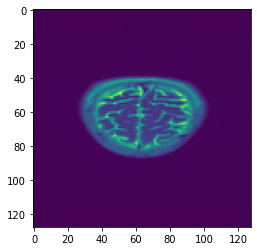

Time taken for epoch:  195.15294313430786
[0, 1]
Dev_Loss 0.010637081037938118 Epoch 1
L1_Loss 0.04358252683805932 L2_Loss 0.010637081037938118 SSIM_Loss 0.7649274565148023 Epoch 1
Epoch = [   1/ 250] TrainLoss = 0.006209  DevLoss = 0.01064 TrainTime = 137.4368s DevTime = 48.1193s


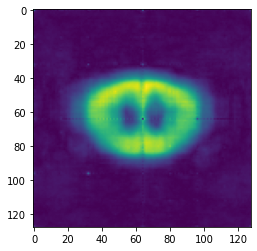

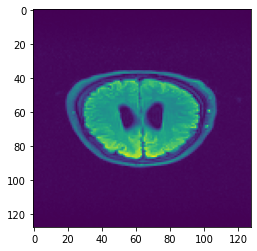

Time taken for epoch:  195.86437034606934
[0, 1]
Dev_Loss 0.008245397771760477 Epoch 2
L1_Loss 0.038832148311317316 L2_Loss 0.008245397771760477 SSIM_Loss 0.8097192860056006 Epoch 2
Epoch = [   2/ 250] TrainLoss = 0.005088  DevLoss = 0.008245 TrainTime = 136.6480s DevTime = 49.0155s


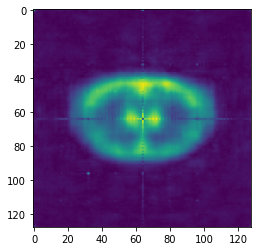

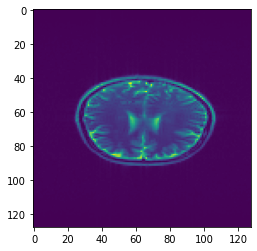

Time taken for epoch:  195.27609062194824
[0, 1]
Dev_Loss 0.00780070787433316 Epoch 3
L1_Loss 0.037504402004911355 L2_Loss 0.00780070787433316 SSIM_Loss 0.8245439612776178 Epoch 3
Epoch = [   3/ 250] TrainLoss = 0.005245  DevLoss = 0.007801 TrainTime = 152.6853s DevTime = 60.6074s


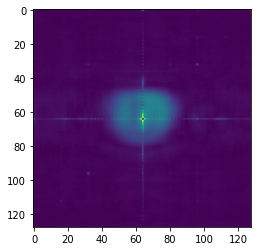

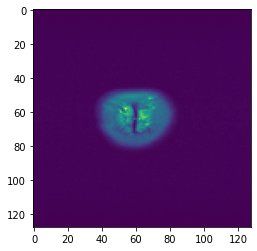

Time taken for epoch:  223.34536457061768
[0, 1]
Dev_Loss 0.005051453027327286 Epoch 4
L1_Loss 0.02867871794105683 L2_Loss 0.005051453027327286 SSIM_Loss 0.8615089638199563 Epoch 4
Epoch = [   4/ 250] TrainLoss = 0.003717  DevLoss = 0.005051 TrainTime = 159.8851s DevTime = 50.9765s


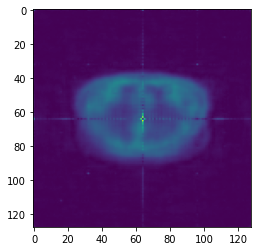

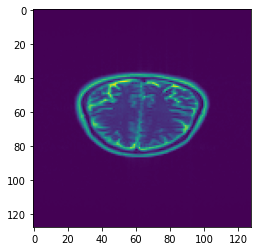

Time taken for epoch:  220.6337947845459
[0, 1]
Dev_Loss 0.010627431902670062 Epoch 5
L1_Loss 0.04337407605189482 L2_Loss 0.010627431902670062 SSIM_Loss 0.8039069735397661 Epoch 5
Epoch = [   5/ 250] TrainLoss = 0.00396  DevLoss = 0.01063 TrainTime = 141.5360s DevTime = 71.5043s


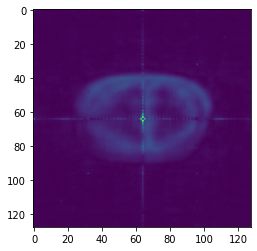

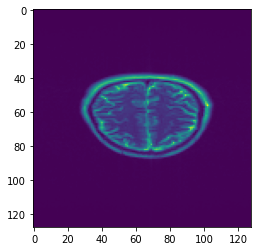

Time taken for epoch:  219.1715965270996
[0, 1]
Dev_Loss 0.0070952219373120245 Epoch 6
L1_Loss 0.0351925802384028 L2_Loss 0.0070952219373120245 SSIM_Loss 0.8462095273924878 Epoch 6
Epoch = [   6/ 250] TrainLoss = 0.003973  DevLoss = 0.007095 TrainTime = 148.0511s DevTime = 52.3546s


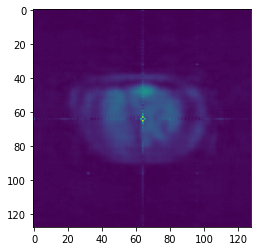

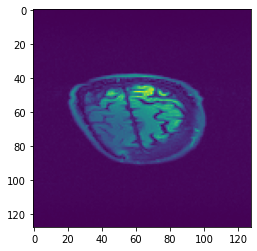

Time taken for epoch:  205.6757791042328
[0, 1]
Dev_Loss 0.004795134755454048 Epoch 7
L1_Loss 0.028766046690274986 L2_Loss 0.004795134755454048 SSIM_Loss 0.8773503127223055 Epoch 7
Epoch = [   7/ 250] TrainLoss = 0.003026  DevLoss = 0.004795 TrainTime = 142.3711s DevTime = 52.0980s


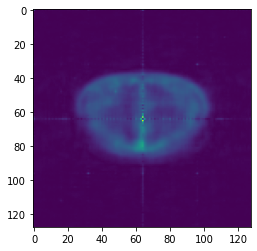

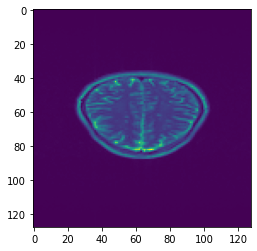

Time taken for epoch:  204.4238109588623
[0, 1]
Dev_Loss 0.003470637872579379 Epoch 8
L1_Loss 0.02781458849428055 L2_Loss 0.003470637872579379 SSIM_Loss 0.832113736404106 Epoch 8
Epoch = [   8/ 250] TrainLoss = 0.003146  DevLoss = 0.003471 TrainTime = 141.8835s DevTime = 51.5549s


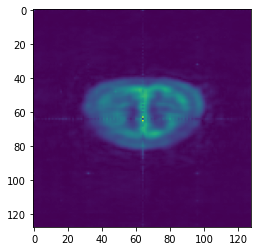

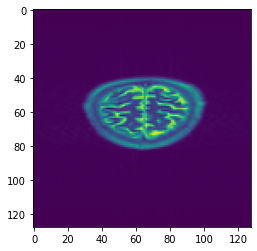

Time taken for epoch:  203.36961841583252
[0, 1]
Dev_Loss 0.0036678186188182824 Epoch 9
L1_Loss 0.026129155713714963 L2_Loss 0.0036678186188182824 SSIM_Loss 0.8918059088692728 Epoch 9
Epoch = [   9/ 250] TrainLoss = 0.002826  DevLoss = 0.003668 TrainTime = 138.7339s DevTime = 49.4809s


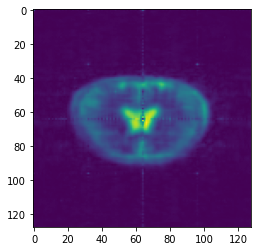

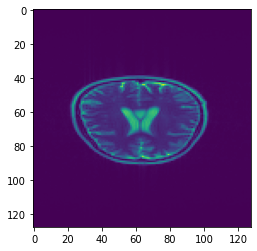

Time taken for epoch:  193.6561553478241
[0, 1]
Dev_Loss 0.005925849801111843 Epoch 10
L1_Loss 0.03384533394141935 L2_Loss 0.005925849801111843 SSIM_Loss 0.8670899787353556 Epoch 10
Epoch = [  10/ 250] TrainLoss = 0.00285  DevLoss = 0.005926 TrainTime = 141.1610s DevTime = 52.0398s


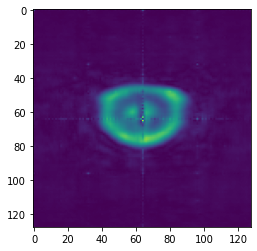

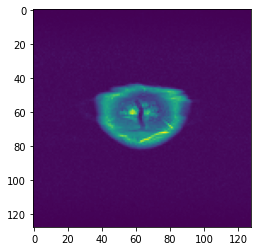

Time taken for epoch:  198.54421305656433
[0, 1]
Dev_Loss 0.00545428194462444 Epoch 11
L1_Loss 0.032645519697723065 L2_Loss 0.00545428194462444 SSIM_Loss 0.8714638544748091 Epoch 11
Epoch = [  11/ 250] TrainLoss = 0.002371  DevLoss = 0.005454 TrainTime = 141.4062s DevTime = 51.9449s


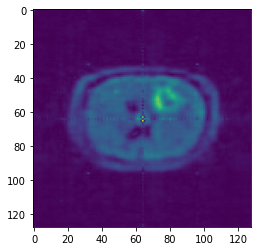

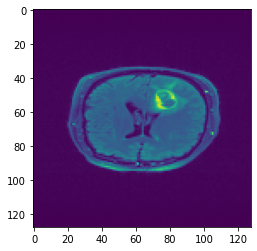

Time taken for epoch:  198.78004670143127
[0, 1]
Dev_Loss 0.0029149256871806436 Epoch 12
L1_Loss 0.025599355983762784 L2_Loss 0.0029149256871806436 SSIM_Loss 0.8646234268628585 Epoch 12
Epoch = [  12/ 250] TrainLoss = 0.001942  DevLoss = 0.002915 TrainTime = 142.5643s DevTime = 51.9102s


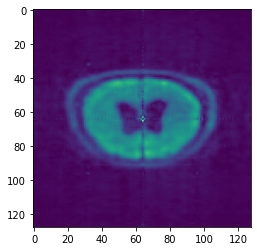

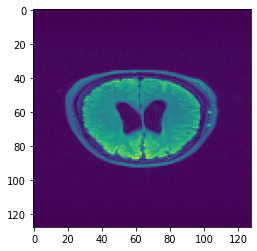

Time taken for epoch:  204.69428396224976
[0, 1]
Dev_Loss 0.004021062584379475 Epoch 13
L1_Loss 0.028429569138577384 L2_Loss 0.004021062584379475 SSIM_Loss 0.8964754013145317 Epoch 13
Epoch = [  13/ 250] TrainLoss = 0.002744  DevLoss = 0.004021 TrainTime = 141.2182s DevTime = 51.4155s


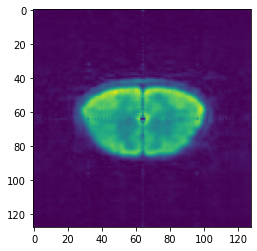

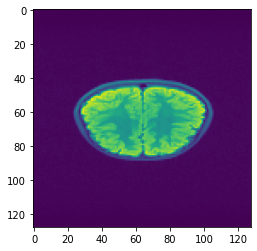

Time taken for epoch:  197.9717719554901
[0, 1]
Dev_Loss 0.004666404004115906 Epoch 14
L1_Loss 0.03070515680253807 L2_Loss 0.004666404004115906 SSIM_Loss 0.8884437186305665 Epoch 14
Epoch = [  14/ 250] TrainLoss = 0.00212  DevLoss = 0.004666 TrainTime = 141.8857s DevTime = 52.0545s


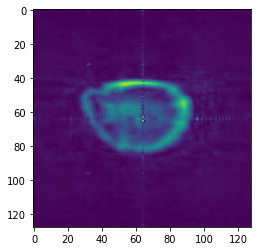

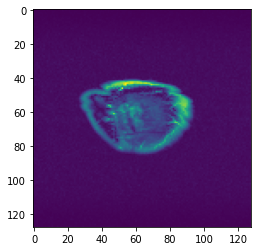

Time taken for epoch:  199.29745769500732
[0, 1]
Dev_Loss 0.005559870164390634 Epoch 15
L1_Loss 0.032979990536584444 L2_Loss 0.005559870164390634 SSIM_Loss 0.8786100094781997 Epoch 15
Epoch = [  15/ 250] TrainLoss = 0.001751  DevLoss = 0.00556 TrainTime = 139.0667s DevTime = 49.0229s


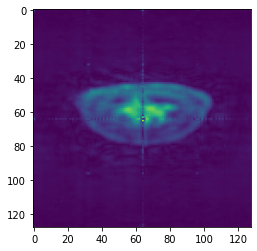

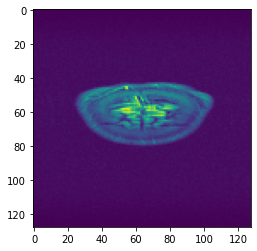

Time taken for epoch:  193.58230662345886
[0, 1]
Dev_Loss 0.004427136667567574 Epoch 16
L1_Loss 0.028539161918342527 L2_Loss 0.004427136667567574 SSIM_Loss 0.893684636228979 Epoch 16
Epoch = [  16/ 250] TrainLoss = 0.001466  DevLoss = 0.004427 TrainTime = 137.0939s DevTime = 48.5699s


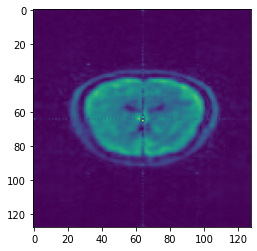

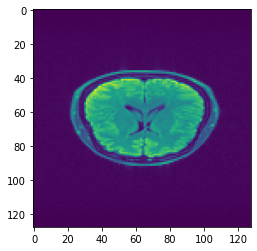

Time taken for epoch:  191.39870405197144
[0, 1]
Dev_Loss 0.005786324387814585 Epoch 17
L1_Loss 0.03239483170012597 L2_Loss 0.005786324387814585 SSIM_Loss 0.8817923959109281 Epoch 17
Epoch = [  17/ 250] TrainLoss = 0.001559  DevLoss = 0.005786 TrainTime = 137.6205s DevTime = 48.3732s


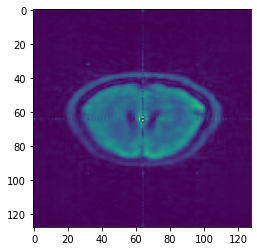

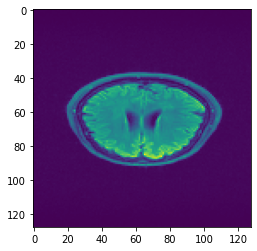

Time taken for epoch:  191.50482177734375
[0, 1]
Dev_Loss 0.004470101583024541 Epoch 18
L1_Loss 0.025092164524484838 L2_Loss 0.004470101583024541 SSIM_Loss 0.8942329925676893 Epoch 18
Epoch = [  18/ 250] TrainLoss = 0.001408  DevLoss = 0.00447 TrainTime = 137.5856s DevTime = 48.8401s


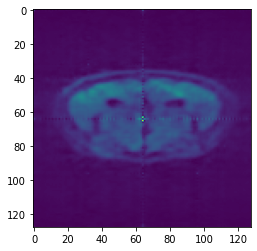

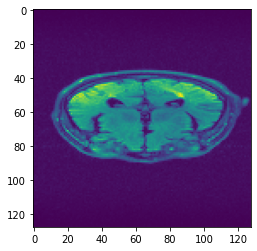

Time taken for epoch:  191.80502009391785
[0, 1]
Dev_Loss 0.008590109834706617 Epoch 19
L1_Loss 0.038534344031317475 L2_Loss 0.008590109834706617 SSIM_Loss 0.8548307687135389 Epoch 19
Epoch = [  19/ 250] TrainLoss = 0.001962  DevLoss = 0.00859 TrainTime = 137.3491s DevTime = 48.4271s


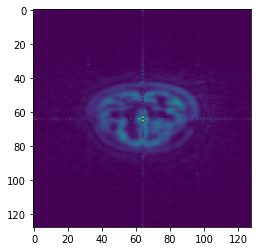

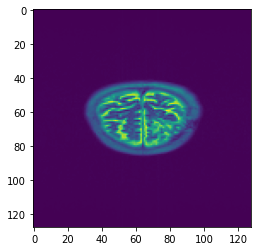

Time taken for epoch:  190.83455657958984
[0, 1]
Dev_Loss 0.007352343086731302 Epoch 20
L1_Loss 0.033007764246304964 L2_Loss 0.007352343086731302 SSIM_Loss 0.8765453627612984 Epoch 20
Epoch = [  20/ 250] TrainLoss = 0.001754  DevLoss = 0.007352 TrainTime = 137.7543s DevTime = 48.5706s


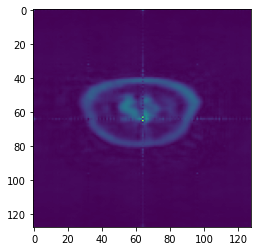

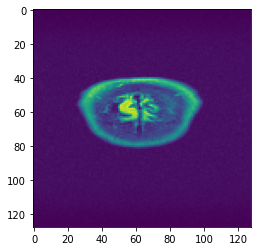

Time taken for epoch:  191.44134664535522
[0, 1]
Dev_Loss 0.0070756880786065355 Epoch 21
L1_Loss 0.02940019749450253 L2_Loss 0.0070756880786065355 SSIM_Loss 0.8873454880582734 Epoch 21
Epoch = [  21/ 250] TrainLoss = 0.001522  DevLoss = 0.007076 TrainTime = 137.7961s DevTime = 48.8553s


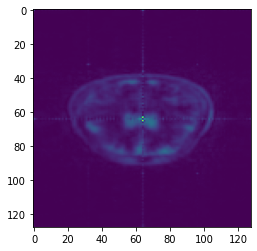

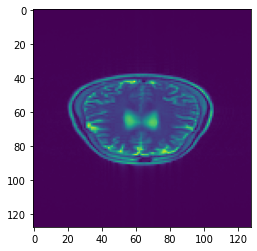

Time taken for epoch:  192.11998891830444
[0, 1]
Dev_Loss 0.007774497797640979 Epoch 22
L1_Loss 0.03130000674026961 L2_Loss 0.007774497797640979 SSIM_Loss 0.8809868387803119 Epoch 22
Epoch = [  22/ 250] TrainLoss = 0.001323  DevLoss = 0.007774 TrainTime = 139.9057s DevTime = 51.9794s


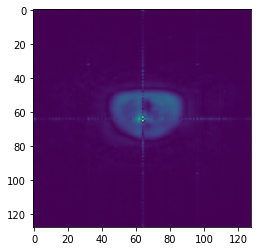

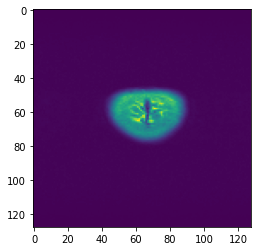

Time taken for epoch:  197.3272430896759
[0, 1]
Dev_Loss 0.008324332210819898 Epoch 23
L1_Loss 0.031406779656364174 L2_Loss 0.008324332210819898 SSIM_Loss 0.8814513568067744 Epoch 23
Epoch = [  23/ 250] TrainLoss = 0.001318  DevLoss = 0.008324 TrainTime = 140.3861s DevTime = 49.9618s


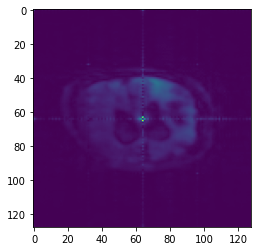

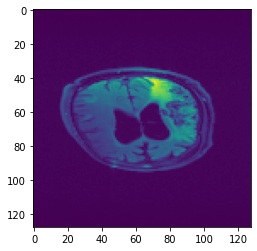

Time taken for epoch:  195.83217525482178
[0, 1]
Dev_Loss 0.008212136788822183 Epoch 24
L1_Loss 0.02867024658582275 L2_Loss 0.008212136788822183 SSIM_Loss 0.8852339369978873 Epoch 24
Epoch = [  24/ 250] TrainLoss = 0.001493  DevLoss = 0.008212 TrainTime = 139.1847s DevTime = 49.4187s


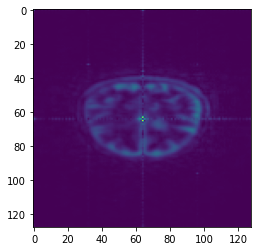

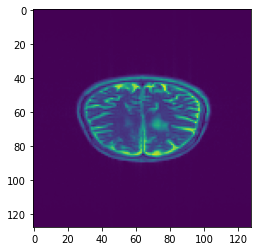

Time taken for epoch:  194.0622682571411
[0, 1]
Dev_Loss 0.008971423528565253 Epoch 25
L1_Loss 0.025679095397309986 L2_Loss 0.008971423528565253 SSIM_Loss 0.8918740588201157 Epoch 25
Epoch = [  25/ 250] TrainLoss = 0.001201  DevLoss = 0.008971 TrainTime = 139.8881s DevTime = 52.1411s


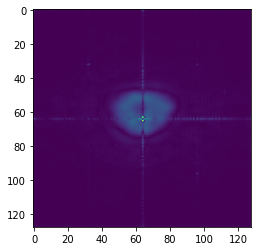

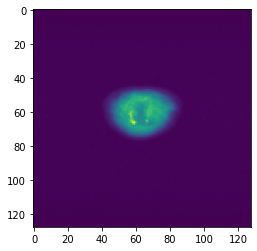

Time taken for epoch:  197.4400041103363
[0, 1]
Dev_Loss 0.010079966291674639 Epoch 26
L1_Loss 0.02967862590290421 L2_Loss 0.010079966291674639 SSIM_Loss 0.8808772594960577 Epoch 26
Epoch = [  26/ 250] TrainLoss = 0.001142  DevLoss = 0.01008 TrainTime = 141.6154s DevTime = 51.4359s


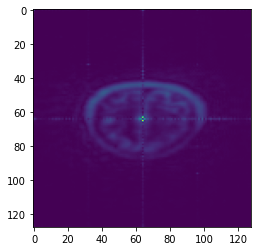

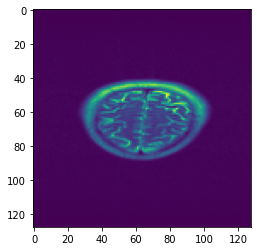

Time taken for epoch:  198.9060719013214
[0, 1]
Dev_Loss 0.010739232749749668 Epoch 27
L1_Loss 0.026491991134013113 L2_Loss 0.010739232749749668 SSIM_Loss 0.8856038966883127 Epoch 27
Epoch = [  27/ 250] TrainLoss = 0.001179  DevLoss = 0.01074 TrainTime = 141.8781s DevTime = 51.6016s


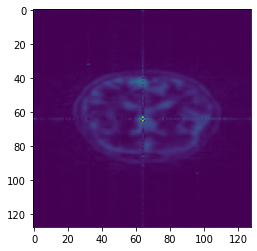

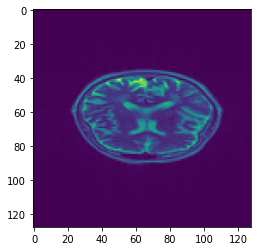

Time taken for epoch:  199.00170612335205
[0, 1]
Dev_Loss 0.012381079444864367 Epoch 28
L1_Loss 0.028703871221270914 L2_Loss 0.012381079444864367 SSIM_Loss 0.8768134856640013 Epoch 28
Epoch = [  28/ 250] TrainLoss = 0.001419  DevLoss = 0.01238 TrainTime = 142.0199s DevTime = 51.8343s


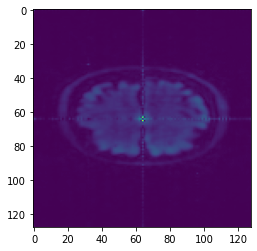

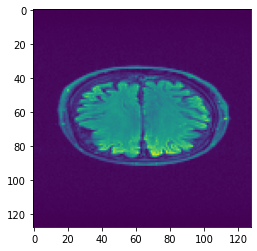

Time taken for epoch:  200.65765357017517
[0, 1]


In [ ]:
def train(args): 
    args.exp_dir.mkdir(parents=True, exist_ok=True)
    writer = SummaryWriter(logdir=str(args.logdir)) #log directory for run

    if args.resume: #be aware of the option
        checkpoint, model, optimizer = load_model(args.checkpoint,args)
        args = checkpoint['args']
        best_dev_loss = checkpoint['best_dev_loss']
        #start_epoch = checkpoint['epoch']
        start_epoch = 0
        del checkpoint
    else:
        model = build_model(args)
        optimizer = build_optim(args, model.parameters())
        best_dev_loss = 1e9
        start_epoch = 0
    logging.info(args)
    logging.info(model)

    #train_loader,dev_loader,test_loader = create_data_loaders()
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, args.lr_step_size, args.lr_gamma)
    optimizer.step()

    for epoch in range(start_epoch, args.num_epochs):
        ti=time.time()
        scheduler.step(epoch)
        train_loss, train_time = train_epoch(args, epoch, model, train_loader, optimizer, writer)
        dev_loss, dev_time = evaluate(args, epoch, model, dev_loader, writer)
        #visualize(args, epoch, model, train_loader, writer)

        is_new_best = dev_loss < best_dev_loss
        best_dev_loss = min(best_dev_loss, dev_loss)
        save_model(args, args.exp_dir, epoch, model, optimizer, best_dev_loss, is_new_best)
        print(f'Epoch = [{epoch:4d}/{args.num_epochs:4d}] TrainLoss = {train_loss:.4g} ',
        f'DevLoss = {dev_loss:.4g} TrainTime = {train_time:.4f}s DevTime = {dev_time:.4f}s')
        
        for iter, data in enumerate(train_loader):
            kspace, full = data
            input = kspace.to(f'{args.device}:{model.device_ids[0]}')
            target = full.to(f'{args.device}:{model.device_ids[0]}')
            output_r,output_i = model(input)
            output_r=output_r.to('cpu').detach().numpy()
            output_i=output_i.to('cpu').detach().numpy()
            output = output_r+output_i*1j
            image = abs(output.squeeze(1))
            #image=zero_middle(image)
            #print(output)
            plt.imshow(image[0,:,:])
            plt.show()
            plt.imshow(target[0,:,:].to('cpu').detach().numpy())
            plt.show()
            break;
        
        logging.info(
            f'Epoch = [{epoch:4d}/{args.num_epochs:4d}] TrainLoss = {train_loss:.4g} '
            f'DevLoss = {dev_loss:.4g} TrainTime = {train_time:.4f}s DevTime = {dev_time:.4f}s',
        )
        print("Time taken for epoch: ",time.time()-ti)
    writer.close()
    return dev_loss
    
train(args)

In [20]:
#f ="/mnt/mnt/5TB_slot2/Tobias/Thesis/FF_lrelue_2020/best_model.pt"
checkpoint, model, optimizer = load_model(args.checkpoint,args)
model.eval()

Model build successfully
Model load successfully


DataParallel(
  (module): ComplexEndToEnd(
    (f_layer1): ComplexConv2d(
      (conv_r): Conv2d(1, 128, kernel_size=(1, 128), stride=(1, 1), bias=False)
      (conv_i): Conv2d(1, 128, kernel_size=(1, 128), stride=(1, 1), bias=False)
    )
    (f_layer2): ComplexConv2d(
      (conv_r): Conv2d(1, 128, kernel_size=(1, 128), stride=(1, 1), bias=False)
      (conv_i): Conv2d(1, 128, kernel_size=(1, 128), stride=(1, 1), bias=False)
    )
    (down_sample_layers): ModuleList(
      (0): ConvBlock(in_chans=16, out_chans=32, drop_prob=0.0)
      (1): ConvBlock(in_chans=32, out_chans=64, drop_prob=0.0)
      (2): ConvBlock(in_chans=64, out_chans=128, drop_prob=0.0)
      (3): ConvBlock(in_chans=128, out_chans=256, drop_prob=0.0)
    )
    (conv): ConvBlock(in_chans=256, out_chans=512, drop_prob=0.0)
    (up_conv): ModuleList(
      (0): ConvBlock(in_chans=512, out_chans=256, drop_prob=0.0)
      (1): ConvBlock(in_chans=256, out_chans=128, drop_prob=0.0)
      (2): ConvBlock(in_chans=128, out_ch

module.f_layer1.conv_r.weight tensor([[[[ 0.0042, -0.0048,  0.0045,  ..., -0.0048,  0.0045, -0.0050]]],


        [[[ 0.0019, -0.0017,  0.0024,  ..., -0.0006,  0.0012, -0.0016]]],


        [[[-0.0068,  0.0080, -0.0074,  ...,  0.0063, -0.0066,  0.0071]]],


        ...,


        [[[ 0.0068, -0.0076,  0.0075,  ..., -0.0048,  0.0056, -0.0064]]],


        [[[-0.0065,  0.0071, -0.0071,  ...,  0.0053, -0.0058,  0.0065]]],


        [[[-0.0035,  0.0023, -0.0025,  ...,  0.0042, -0.0041,  0.0037]]]],
       device='cuda:0', dtype=torch.float64)


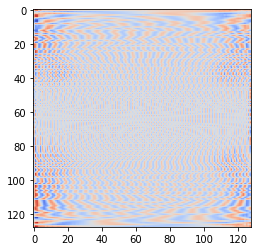

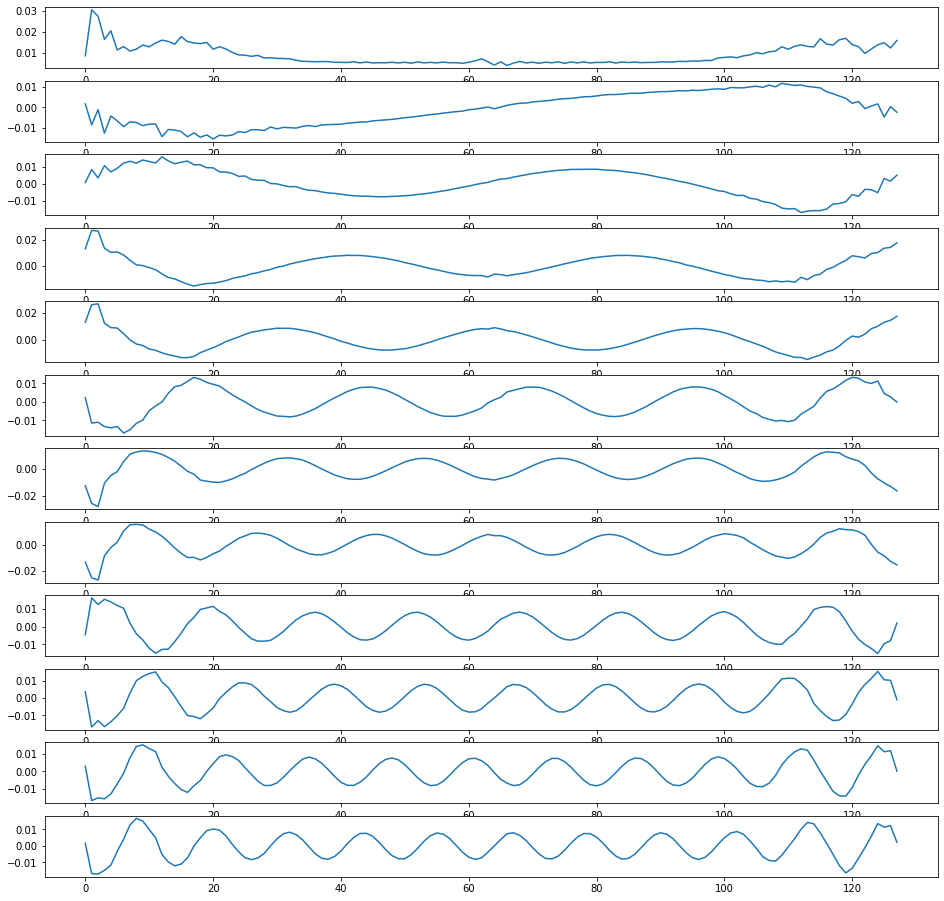

module.f_layer1.conv_i.weight tensor([[[[ 0.0062, -0.0067,  0.0062,  ..., -0.0064,  0.0062, -0.0062]]],


        [[[-0.0084,  0.0072, -0.0079,  ...,  0.0077, -0.0079,  0.0077]]],


        [[[ 0.0031, -0.0021,  0.0015,  ..., -0.0051,  0.0045, -0.0039]]],


        ...,


        [[[ 0.0037, -0.0026,  0.0018,  ..., -0.0064,  0.0056, -0.0047]]],


        [[[-0.0037,  0.0041, -0.0026,  ...,  0.0062, -0.0054,  0.0049]]],


        [[[ 0.0079, -0.0070,  0.0079,  ..., -0.0065,  0.0070, -0.0068]]]],
       device='cuda:0', dtype=torch.float64)


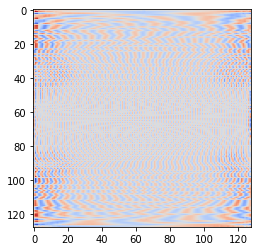

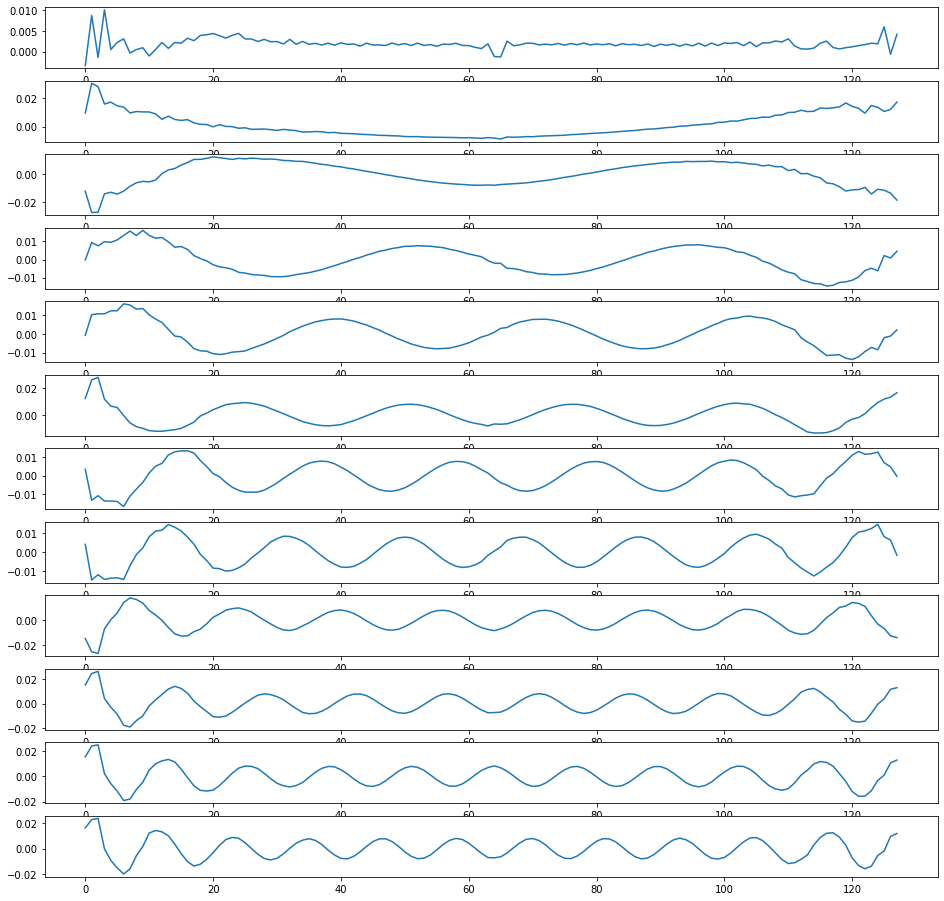

module.f_layer2.conv_r.weight tensor([[[[ 0.0061, -0.0072,  0.0065,  ..., -0.0073,  0.0061, -0.0076]]],


        [[[ 0.0035, -0.0035,  0.0041,  ..., -0.0025,  0.0025, -0.0032]]],


        [[[ 0.0050, -0.0041,  0.0035,  ..., -0.0069,  0.0054, -0.0060]]],


        ...,


        [[[-0.0057,  0.0055, -0.0042,  ...,  0.0074, -0.0071,  0.0066]]],


        [[[ 0.0024, -0.0015,  0.0010,  ..., -0.0041,  0.0040, -0.0027]]],


        [[[-0.0041,  0.0033, -0.0033,  ...,  0.0049, -0.0044,  0.0040]]]],
       device='cuda:0', dtype=torch.float64)


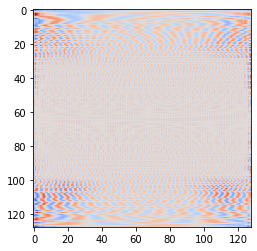

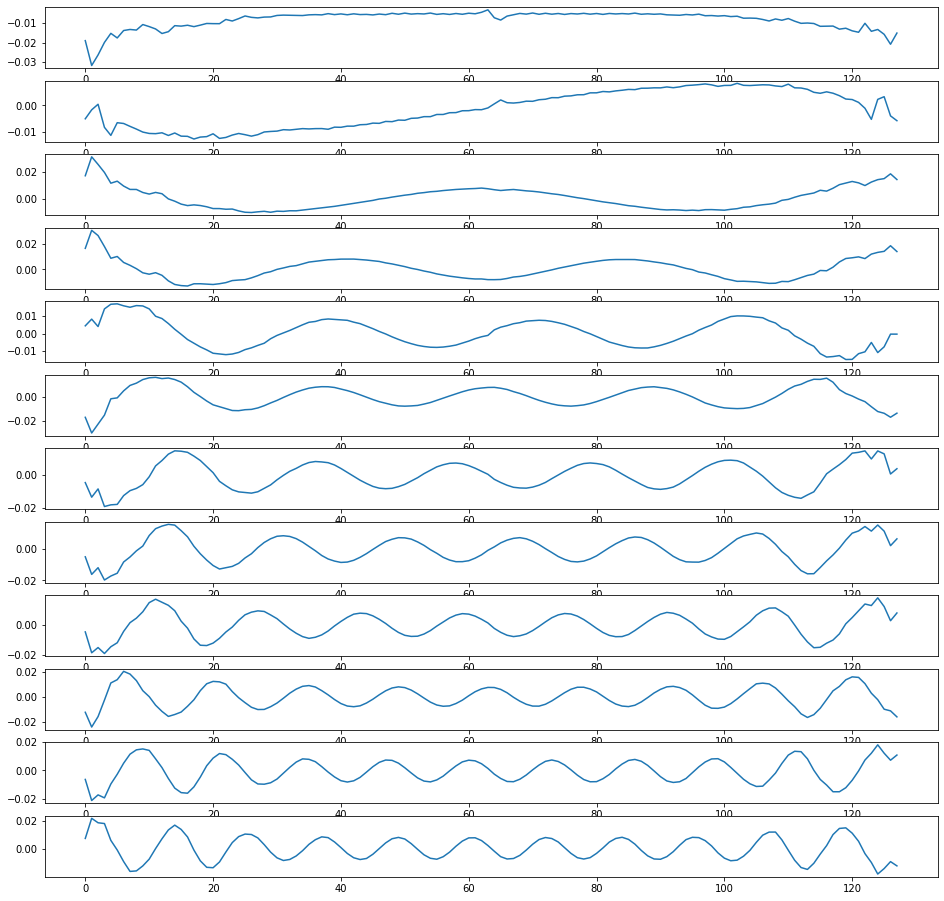

module.f_layer2.conv_i.weight tensor([[[[ 0.0036, -0.0028,  0.0031,  ..., -0.0037,  0.0030, -0.0032]]],


        [[[-0.0069,  0.0065, -0.0065,  ...,  0.0074, -0.0070,  0.0072]]],


        [[[ 0.0062, -0.0062,  0.0069,  ..., -0.0039,  0.0052, -0.0045]]],


        ...,


        [[[ 0.0050, -0.0057,  0.0065,  ..., -0.0018,  0.0031, -0.0038]]],


        [[[-0.0074,  0.0074, -0.0076,  ...,  0.0062, -0.0068,  0.0066]]],


        [[[ 0.0066, -0.0065,  0.0068,  ..., -0.0063,  0.0057, -0.0071]]]],
       device='cuda:0', dtype=torch.float64)


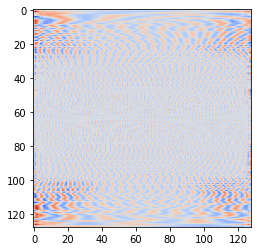

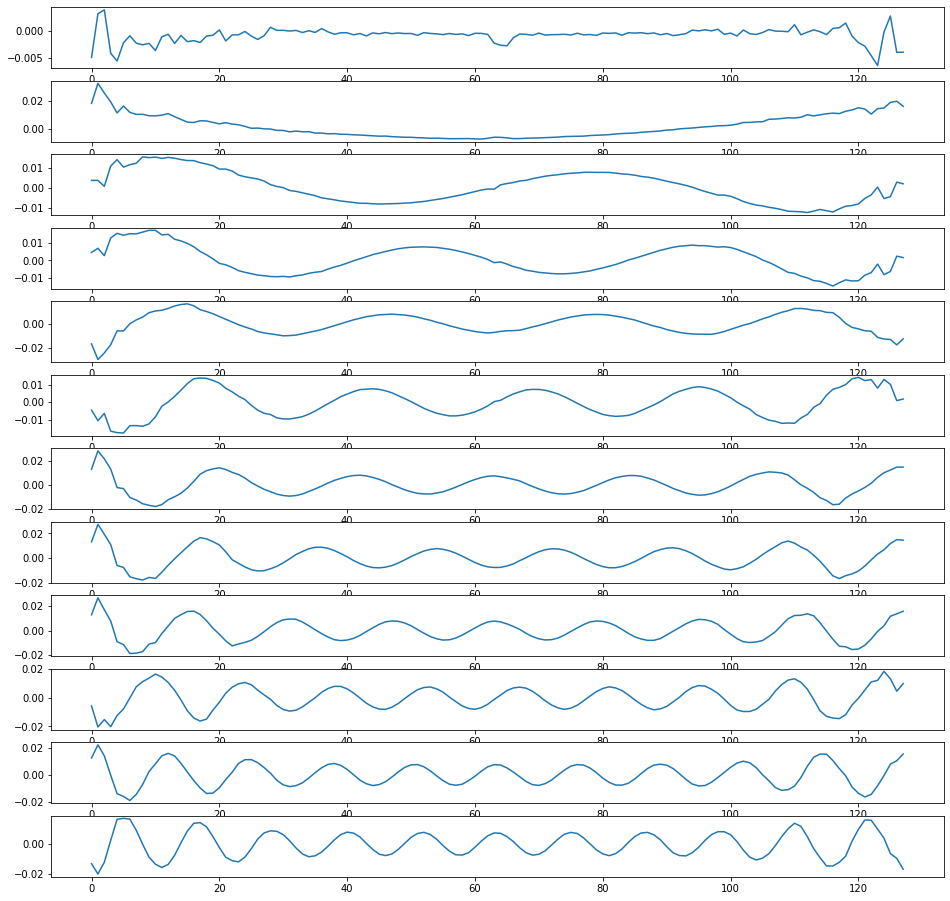

module.down_sample_layers.0.layers.0.conv_r.weight tensor([[[[ 0.0090, -0.0341,  0.0046],
          [-0.0620,  0.0167,  0.0382],
          [ 0.0386, -0.0786, -0.0154]],

         [[-0.0457, -0.0708,  0.0710],
          [-0.0765, -0.0678, -0.0657],
          [-0.0151,  0.0267,  0.0162]],

         [[ 0.0245, -0.0616, -0.0214],
          [ 0.0577,  0.0147, -0.0003],
          [ 0.0727, -0.0656, -0.0357]],

         ...,

         [[ 0.0239, -0.0449,  0.0415],
          [-0.0440, -0.0774, -0.0042],
          [ 0.0634,  0.0315,  0.0003]],

         [[-0.0249, -0.0195,  0.0110],
          [-0.0664,  0.0018,  0.0335],
          [ 0.0245,  0.0136, -0.0549]],

         [[-0.0017, -0.0350, -0.0422],
          [ 0.0231, -0.0589, -0.0198],
          [ 0.0527,  0.0093,  0.0035]]],


        [[[ 0.0006, -0.0660,  0.0581],
          [ 0.0246, -0.0599, -0.0414],
          [ 0.0025, -0.0129,  0.0176]],

         [[ 0.0663,  0.0060, -0.0643],
          [-0.0846,  0.0250, -0.0809],
          [-0.0681, -

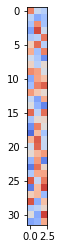

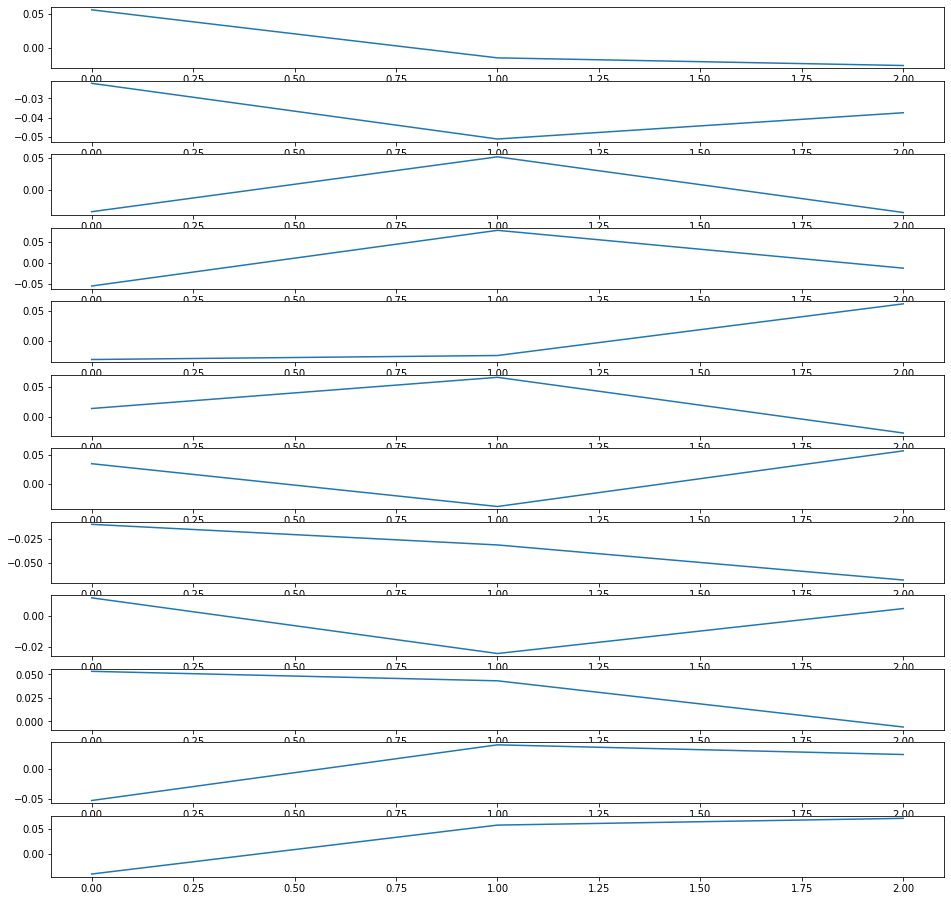

module.down_sample_layers.0.layers.0.conv_i.weight tensor([[[[ 0.0381,  0.0851, -0.0227],
          [ 0.0510,  0.0038, -0.0225],
          [ 0.0042,  0.0604, -0.0237]],

         [[ 0.0042, -0.0025,  0.0008],
          [-0.0785, -0.0651,  0.0511],
          [ 0.0599, -0.0383,  0.0018]],

         [[-0.0632, -0.0587, -0.0702],
          [ 0.0448,  0.0309,  0.0128],
          [ 0.0611,  0.0678, -0.0526]],

         ...,

         [[-0.0787,  0.0685, -0.0133],
          [-0.0584,  0.0928, -0.0243],
          [-0.0452,  0.0247,  0.0437]],

         [[-0.0711,  0.0718,  0.0473],
          [ 0.0212,  0.0115,  0.0645],
          [ 0.0034,  0.0640, -0.0174]],

         [[ 0.0545, -0.0013,  0.0782],
          [-0.0300,  0.0527, -0.0352],
          [ 0.0516,  0.0582,  0.0428]]],


        [[[ 0.0088,  0.0548,  0.0522],
          [-0.0195, -0.0739, -0.0348],
          [-0.0014,  0.0032, -0.0325]],

         [[-0.0786,  0.0215, -0.0602],
          [ 0.0411,  0.0211,  0.0616],
          [-0.0189, -

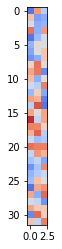

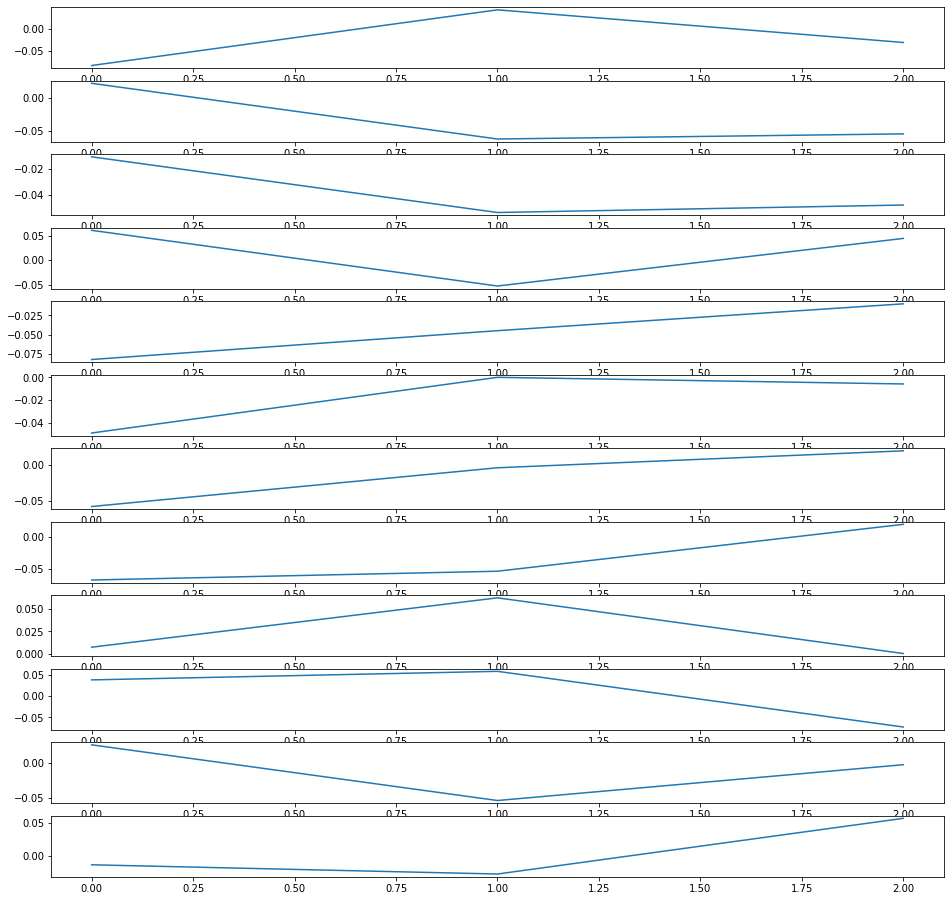

module.down_sample_layers.0.layers.1.weight tensor([[ 1.4106e+00,  1.4147e+00,  1.0570e-03],
        [ 1.4122e+00,  1.4186e+00, -8.7756e-04],
        [ 1.4098e+00,  1.4180e+00,  2.7278e-03],
        [ 1.4125e+00,  1.4154e+00,  4.0237e-03],
        [ 1.4150e+00,  1.4130e+00, -6.7558e-03],
        [ 1.4128e+00,  1.4157e+00, -2.3783e-03],
        [ 1.4173e+00,  1.4128e+00, -1.4337e-03],
        [ 1.4109e+00,  1.4174e+00, -2.2643e-03],
        [ 1.4122e+00,  1.4138e+00, -9.7970e-05],
        [ 1.4138e+00,  1.4140e+00,  2.7733e-03],
        [ 1.4133e+00,  1.4139e+00, -3.0869e-03],
        [ 1.4194e+00,  1.4105e+00, -2.8189e-03],
        [ 1.4125e+00,  1.4128e+00,  9.6744e-04],
        [ 1.4119e+00,  1.4122e+00,  3.4959e-03],
        [ 1.4103e+00,  1.4165e+00, -8.1168e-04],
        [ 1.4106e+00,  1.4133e+00,  4.7929e-03],
        [ 1.4118e+00,  1.4138e+00, -1.5945e-03],
        [ 1.4126e+00,  1.4141e+00,  7.1927e-05],
        [ 1.4168e+00,  1.4136e+00,  8.0793e-04],
        [ 1.4276e+00,  1.

IndexError: too many indices for tensor of dimension 2

In [21]:
for name, param in model.named_parameters():
    if param.requires_grad:
        print(name, param.data)
        #plt.imshow(nf.ifftshift(param.data.cpu()[:,0,0,:]), vmin=-1, vmax=1, cmap='coolwarm')
        # Heat map of neuron weights
        weights=nf.ifftshift(param.data.cpu()[:,0,0,:])
        plt.imshow(weights, vmin=np.min(param.data.cpu().numpy()), vmax=np.max(param.data.cpu().numpy()), cmap='coolwarm')
        plt.show()
        fig,ax=plt.subplots(args.resolution//10,1,figsize=(16,16))
        for i in range(args.resolution//10):
            ax[i].plot(weights[i,:args.resolution])
        plt.show()

In [ ]:
def train_plain(args): 
    args.exp_dir.mkdir(parents=True, exist_ok=True)
    writer = SummaryWriter(logdir=str(args.logdir)) #log directory for run
    if args.resume: #be aware of the option
        checkpoint, model, optimizer = load_model(args.checkpoint,args)
        args = checkpoint['args']
        best_dev_loss = checkpoint['best_dev_loss']
        #start_epoch = checkpoint['epoch']
        start_epoch = 0
        del checkpoint
    else:
        model = build_model(args)
        optimizer = build_optim(args, model.parameters())
        best_dev_loss = 1e9
        start_epoch = 0
    #train_loader,dev_loader,test_loader = create_data_loaders()
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, args.lr_step_size, args.lr_gamma)
    optimizer.step()

    for epoch in range(start_epoch, args.num_epochs):
        ti=time.time()
        scheduler.step(epoch)
        train_loss, train_time = train_epoch(args, epoch, model, train_loader, optimizer, writer)
        dev_loss, dev_time = evaluate(args, epoch, model, dev_loader, writer)
        #visualize(args, epoch, model, train_loader, writer)

#         is_new_best = dev_loss < best_dev_loss
#         best_dev_loss = min(best_dev_loss, dev_loss)
#         save_model(args, args.exp_dir, epoch, model, optimizer, best_dev_loss, is_new_best)
    writer.close()
    return dev_loss

def run_model(lr):
    print(lr)
    args.lr=lr
    return train_plain(args)

In [ ]:
from hyperopt import hp, tpe, fmin

# Single line bayesian optimization of polynomial function
args.num_epochs=100
best = fmin(fn=lambda x: run_model(x),
            space=hp.normal('x', 0.0001, 0.5),
            algo=tpe.suggest,
            max_evals=100)

In [ ]:
print(best)

/mnt/mnt/5TB_slot2/Tobias/Thesis/FF_lrelu_ComplexEndToEnd_Kspace_Spiral_multiChannel/best_model.pt
Model build successfully
Model load successfully


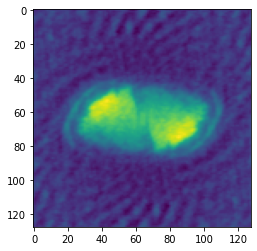

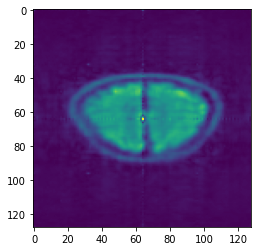

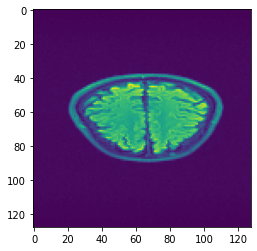

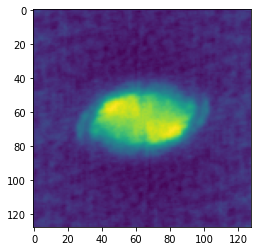

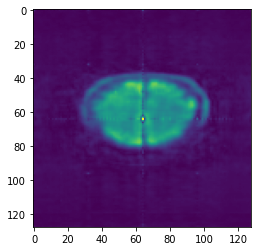

...

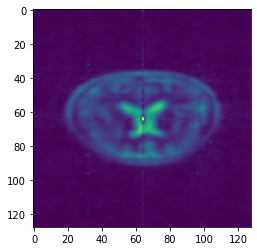

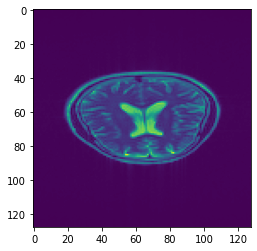

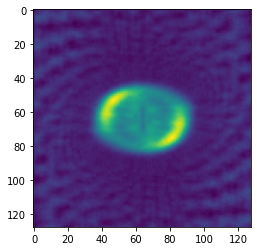

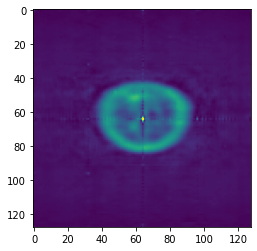

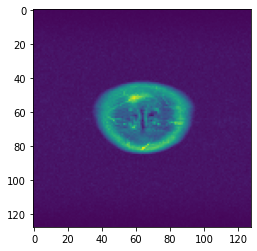

0.024790116886569874 0.003316298724635316 0.9092275944029704 0.019524373400841098 0.03421164802772833 0.0024401144447491166 0.004829502733900666 0.8736716572881835 0.9303557011785748
0.002414937447359685 0.00044988430271589446 0.01192299778453153


In [23]:
c=args.checkpoint#"/mnt/mnt/5TB_slot2/Tobias/Thesis/FF_lrelu_pure_inverse_fourier/best_model.pt
print(c)
#c='/mnt/mnt/5TB_slot2/Tobias/Thesis/FF_lrelu_ComplexEndToEnd'+'/model.pt'
checkpoint, model, optimizer = load_model(c,args)
model.eval()
losses=[]
torch.cuda.empty_cache()
for iter, data in enumerate(train_loader):
    with torch.no_grad():
            f, t = data
            #plt.hist(f[abs(f) >= 0.00001].flatten(),bins=1000)
            #plt.show()
            plt.imshow(abs(nu.make_ift(nu.to_complex(f)))[0,0,:,:])
            plt.show()
            
            input = f.to(f'{args.device}:{model.device_ids[0]}')
            target = t.to(f'{args.device}:{model.device_ids[0]}')
            
            output_r,output_i = model(input)
            l=eval_loss((output_r.squeeze(1)**2+output_i.squeeze(1)**2)**(1/2),target)
            losses.append(l)
            output_r=output_r.to('cpu').detach().numpy()
            output_i=output_i.to('cpu').detach().numpy()
            output = output_r+output_i*1j
            image = abs(output.squeeze(1))
            #print(output)
            plt.imshow(image[0,:,:],vmin=0,vmax=1)
            plt.show()

            plt.imshow(target[0,:,:].to('cpu').detach().numpy(),vmin=0,vmax=1)
            plt.show()
            #break;
losses=np.array(losses)
print(np.mean(losses[:,0]),np.mean(losses[:,1]),np.mean(losses[:,2]),np.min(losses[:,0]),np.max(losses[:,0]),np.min(losses[:,1]),np.max(losses[:,1]),np.min(losses[:,2]),np.max(losses[:,2]))
print(np.std(losses[:,0]),np.std(losses[:,1]),np.std(losses[:,2]))

In [ ]:
for name, param in model.named_parameters():
    if param.requires_grad:
        print(name, param.data)
        #plt.imshow(nf.ifftshift(param.data.cpu()[:,0,0,:]), vmin=-1, vmax=1, cmap='coolwarm')
        # Heat map of neuron weights
        weights=nf.ifftshift(param.data.cpu()[:,0,0,:])
        np.save(name+'_twoPartKspcae.npy', param.data.cpu())
        plt.imshow(weights, vmin=np.min(param.data.cpu().numpy()), vmax=np.max(param.data.cpu().numpy()), cmap='coolwarm')
        plt.show()
        fig,ax=plt.subplots(args.resolution//10,1,figsize=(16,16))
        for i in range(args.resolution//10):
            ax[i].plot(weights[i,:args.resolution])
        plt.show()